### 데이터 증폭과정(jupyter lab 권장.....)

In [1]:
%run flowers_init.ipynb

C:\Users\JH\anaconda3\envs\GJ_AI\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\JH\anaconda3\envs\GJ_AI\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
C:\Users\JH\anaconda3\envs\GJ_AI\lib\site-packages\numpy\.libs\libopenblas.xwydx2ikjw2nmtwsfyngfuwkqu3lytcz.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
xs, ys = flowers_init([100,100])

dname : daisy
subpath : dataset/flowers//daisy
filenames :
 ['100080576_f52e8ee070_n.jpg', '10140303196_b88d3d6cec.jpg', '10172379554_b296050f82_n.jpg']
dname : dandelion
subpath : dataset/flowers//dandelion
filenames :
 ['10043234166_e6dd915111_n.jpg', '10200780773_c6051a7d71_n.jpg', '10294487385_92a0676c7d_m.jpg']
dname : rose
subpath : dataset/flowers//rose
filenames :
 ['10090824183_d02c613f10_m.jpg', '102501987_3cdb8e5394_n.jpg', '10503217854_e66a804309.jpg']
dname : sunflower
subpath : dataset/flowers//sunflower
filenames :
 ['1008566138_6927679c8a.jpg', '1022552002_2b93faf9e7_n.jpg', '1022552036_67d33d5bd8_n.jpg']
dname : tulip
subpath : dataset/flowers//tulip
filenames :
 ['100930342_92e8746431_n.jpg', '10094729603_eeca3f2cb6.jpg', '10094731133_94a942463c.jpg']


In [3]:
#종속변수를 만들어주는 함수. 원핫 인코딩

def onehot(idxs,cnt):
    return np.eye(ent)[idxs]

In [4]:
cnt=5

np.eye(cnt)

array([[1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1.]])

In [5]:
#이미지 데이터를 증폭시켜주기 위한 라이브러리 불러오기

from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [6]:
# 이미지 증폭을 위한 몇가지 파라미터, 제어
# 정규화를 왜 할까??? 퀴즈. 속도관련, 차원관련.
image_generator = ImageDataGenerator(rotation_range = 10,
                                     zoom_range = 0.10,
                                     shear_range = 0.5, 
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     horizontal_flip = True,
                                     vertical_flip = True)


In [7]:
# 이미지 정규화 과정
xs_norm = xs / 255.0

# 데이터 셔플링 과정 
# 셔플맵 생성 과정
shuffle_map = np.arange(xs_norm.shape[0])
# 셔플맵 뒤섞기
np.random.shuffle(shuffle_map)

print(shuffle_map[:10])

# 학습 / 테스트 분류 과정
# 학습 데이터 비율 설정 및 나눠지는 위치 값 설정
train_ratio = 0.8
test_begin_index = int(xs_norm.shape[0] * train_ratio)
print("test_begin_index : ", test_begin_index)

# 테스트 및 학습 데이터 나눠주는 과정
train_x = xs_norm[shuffle_map[:test_begin_index]]
test_x  = xs_norm[shuffle_map[test_begin_index:]]

train_y = ys[shuffle_map[:test_begin_index]]
test_y  = ys[shuffle_map[test_begin_index:]]

print(train_x.shape)
print(test_x.shape)

print(train_y.shape)
print(test_y.shape)

[3161 2242  122 3224 2308 3373 4087 2846 3283 1846]
test_begin_index :  3453
(3453, 100, 100, 3)
(864, 100, 100, 3)
(3453, 5)
(864, 5)


In [8]:
import numpy as np
# 사용할 함수 np.tile() -> 이 함수에 넣어준 값을 반복해주는 함수
# np
augment_size = 100
x_augment = image_generator.flow(x = np.tile(A = train_x[0].reshape(100*100*3),reps = 100).reshape(-1, 100, 100, 3),
                                # y값(종속)은 지금 당장 필요 없기에 np.zeros()를 통해 처리 
                                y = np.zeros(augment_size),
                                # 동시에 몇 개 만들꺼냐
                                batch_size = augment_size,
                                # 만들어진 이미지가 중복을 허용할 것이냐.
                                # next()[0] 함수 사용시 독립변수를 가져온다, 만약 [1]을 사용하면은 종속변수. 
                                shuffle = False).next()[0]

In [9]:
x_augment.shape

(100, 100, 100, 3)

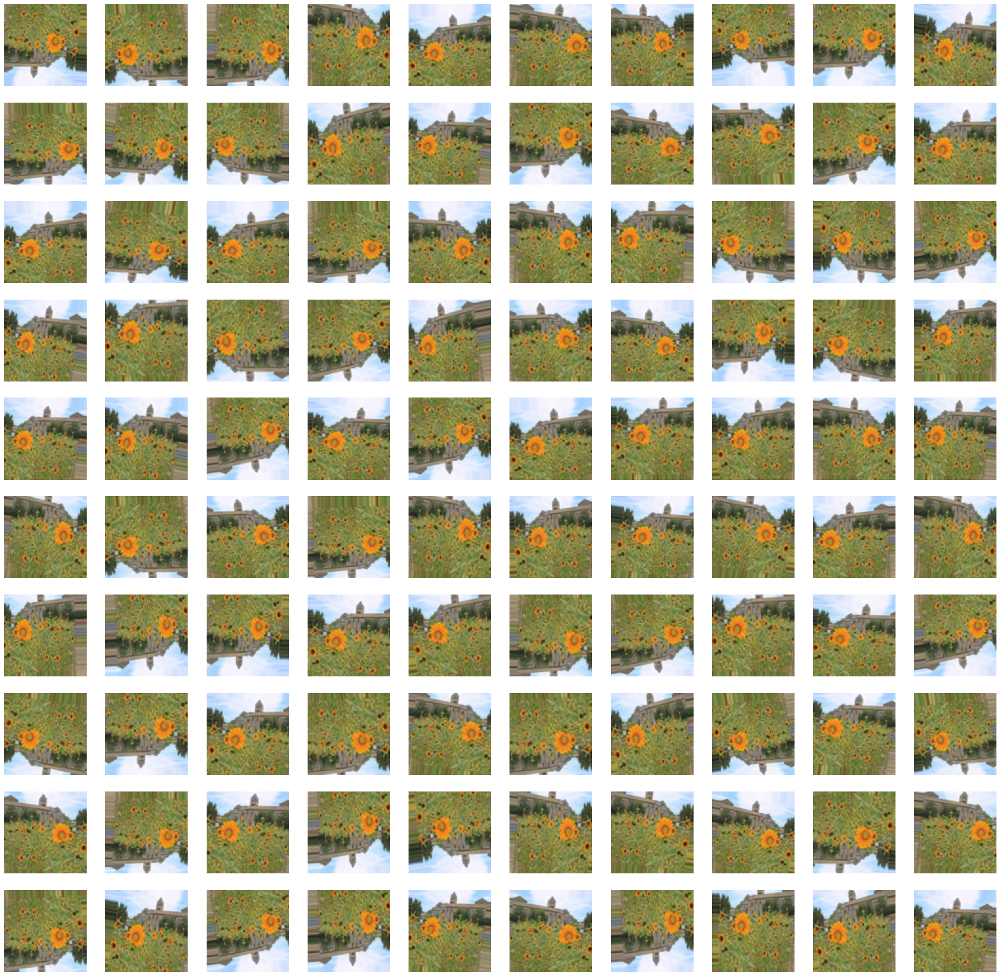

In [10]:
plt.figure(figsize=(30,30))
for i in range(100):
    plt.subplot(10,10,i+1)
    plt.axis('off')
    i = np.random.choice(100, replace =False)
    plt.imshow(x_augment[i])
plt.show()

In [11]:
x_choice= np.random.choice(train_x.shape[0],
                size=int(train_x.shape[0]*0.5),
                replace=False)

x_augmented = train_x[x_choice].copy()
print(x_augmented.shape)

y_augmented = train_y[x_choice].copy()
print(y_augmented.shape)

(1726, 100, 100, 3)
(1726, 5)


In [12]:
# 학습 데이터 전체를 50% 만큼 증폭 시키는 과정

# 전체 데이터의 개수
print("학습 데이터의 개수 : ", train_x.shape[0])

# 증폭시킬 데이터의 개수(50%)
print("증폭시켜줄 데이터의 양 : ", int(train_x.shape[0] * 0.5))
augment_size = int(train_x.shape[0] * 0.5)


학습 데이터의 개수 :  3453
증폭시켜줄 데이터의 양 :  1726


In [13]:
# 데이터 복사본을 만들어 주는 과정 

x_choice = np.random.choice(train_x.shape[0], 
                            size = int(train_x.shape[0] * 0.5), 
                            replace = False)

# 독립변수의 복사본 만들어 주는 과정 
x_augmented = train_x[x_choice].copy()
print("x_augmented.shape : ", x_augmented.shape)

# 종속변수의 복사본 만들어 주는 과정
y_augmented = train_y[x_choice].copy()
print("y_augmented.shape : ", y_augmented.shape)

x_augmented.shape :  (1726, 100, 100, 3)
y_augmented.shape :  (1726, 5)


In [14]:
x_augmented = image_generator.flow(x_augmented,
                                   np.zeros(augment_size),
                                   batch_size = augment_size,
                                   shuffle = False).next()[0]

print("x_augmented.shape", x_augmented.shape)

x_augmented.shape (1726, 100, 100, 3)


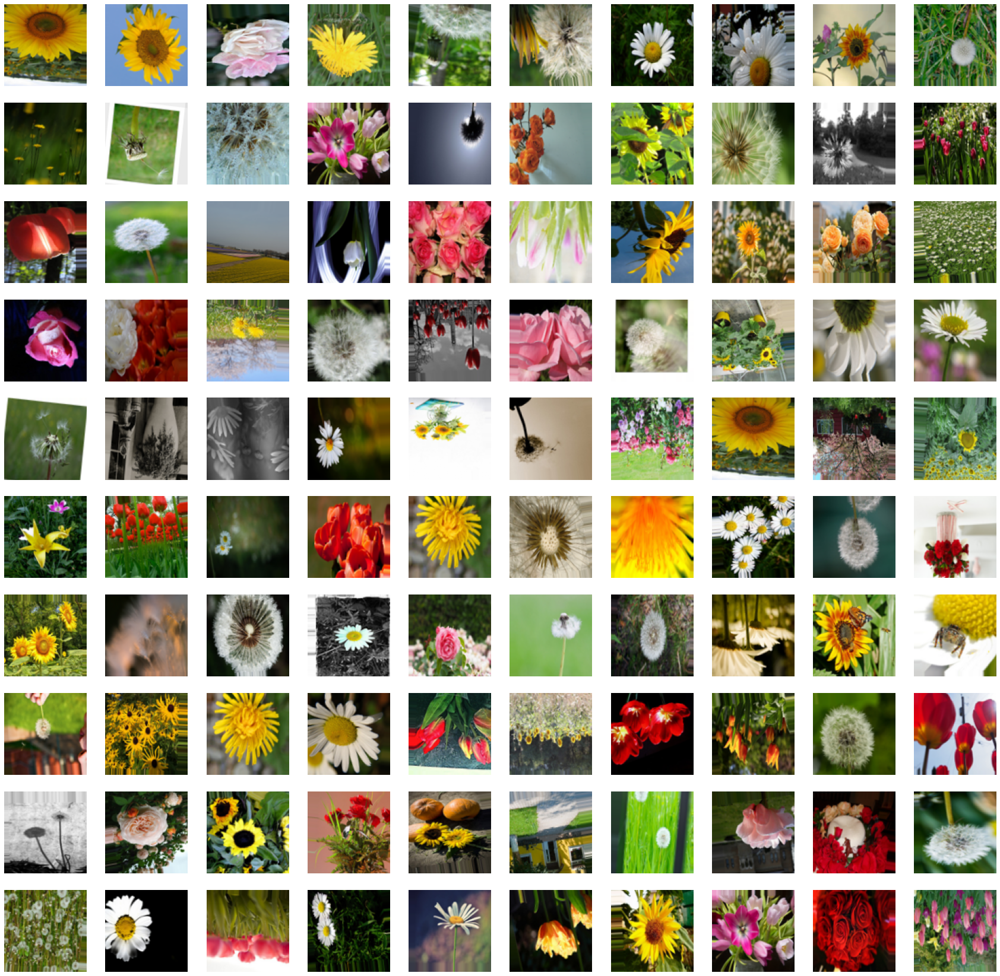

In [15]:
plt.figure(figsize=(30,30))
for i in range(100):
    plt.subplot(10,10,i+1)
    plt.axis('off')
    i = np.random.choice(1726, replace = False)
    plt.imshow(x_augmented[i])
plt.show()

In [16]:
# 독립변수의 결합과정 
train_x = np.concatenate((train_x, x_augmented))
# 종속변수의 결합과정
train_y = np.concatenate((train_y, y_augmented))

print(train_x.shape)
print(train_y.shape)

(5179, 100, 100, 3)
(5179, 5)


In [17]:
# 텐서플로우 내부에 내장된 모바일넷 V2 불러오는 코드 
from tensorflow.keras.applications import MobileNetV2
# 함수형방식으로 계층을 쌓아주는 방식의 함수(Input)
from tensorflow.keras.layers import Input

In [18]:
!nvidia-smi

Thu Sep  9 09:13:55 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 462.31       Driver Version: 462.31       CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce GTX 165... WDDM  | 00000000:01:00.0 Off |                  N/A |
| N/A   62C    P8     4W /  N/A |   1766MiB /  4096MiB |     28%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [19]:
tf.keras.utils.get_file('labels.csv','http://bit.ly/2GDxsYS')
tf.keras.utils.get_file('train.zip','http://bit.ly/31nIyel')
tf.keras.utils.get_file('test.zip','http://bit.ly/2GHEsnO')

'C:\\Users\\JH\\.keras\\datasets\\test.zip'

In [20]:
!unzip train.zip
!unzip test.zip

'unzip'은(는) 내부 또는 외부 명령, 실행할 수 있는 프로그램, 또는
배치 파일이 아닙니다.
'unzip'은(는) 내부 또는 외부 명령, 실행할 수 있는 프로그램, 또는
배치 파일이 아닙니다.


In [21]:
import pandas as pd
import tensorflow as tf
import numpy as np

In [24]:
label_text = pd.read_csv('dog/labels.csv')
print(label_text.head(10))
print(label_text.info())

                                 id               breed
0  000bec180eb18c7604dcecc8fe0dba07         boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97               dingo
2  001cdf01b096e06d78e9e5112d419397            pekinese
3  00214f311d5d2247d5dfe4fe24b2303d            bluetick
4  0021f9ceb3235effd7fcde7f7538ed62    golden_retriever
5  002211c81b498ef88e1b40b9abf84e1d  bedlington_terrier
6  00290d3e1fdd27226ba27a8ce248ce85  bedlington_terrier
7  002a283a315af96eaea0e28e7163b21b              borzoi
8  003df8b8a8b05244b1d920bb6cf451f9             basenji
9  0042188c895a2f14ef64a918ed9c7b64  scottish_deerhound
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB
None


In [25]:
label_text['breed'].nunique()

120

In [26]:
image_id=label_text.loc[0,'id']
print('image id :',image_id)

image id : 000bec180eb18c7604dcecc8fe0dba07


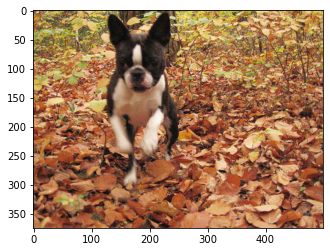

In [28]:
import matplotlib.pyplot as plt
#경로를 잡는 과정
plt.imshow(plt.imread('dog/train/'+image_id+'.jpg'))
plt.show()

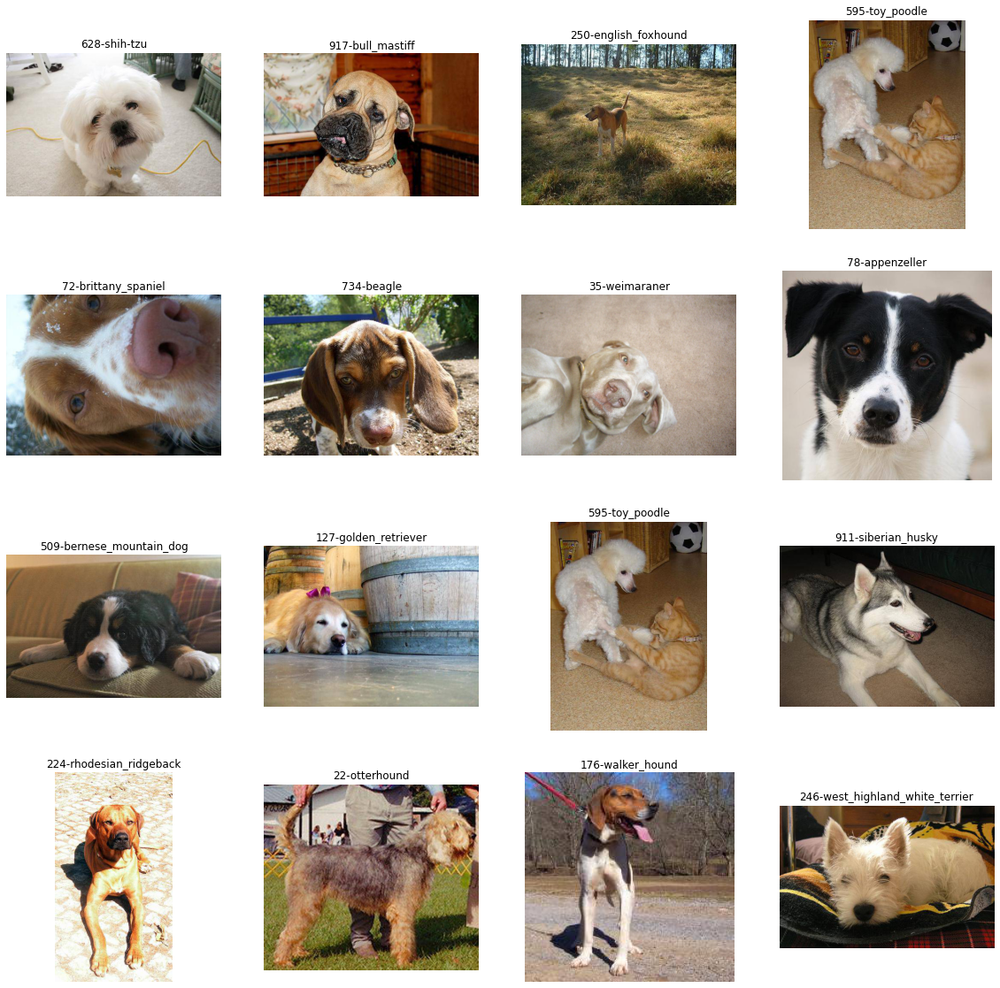

In [31]:
# 사진당 크기 
plt.figure(figsize=(20,20))

# 총 16장의 사진을 출력 
for i in range(16):

    # 가로 4개 세로 4개씩 하여 이미지를 출력합니다.
    plt.subplot(4,4,i+1)

    # 무작위 값을 주어 매번 다른 이미지가 출력되도록 합니다.
    i = np.random.choice(1000)

    #label_text 변수에 loc를 사용하여 
    # [i번 째 행,'id' 라는 열] 의 값을 할당합니다.
    image_id = label_text.loc[i, 'id']

    #절대경로 설정을 활용하여 사진 출력
    # 이미지 
    plt.imshow(plt.imread('dog/train/' + image_id + '.jpg'))

    #사진과 함께 번호(i) + 제목 ( loc[i,'breed'] ) 출력
    plt.title(str(i) + '-' + label_text.loc[i, 'breed'])

    # 축 정보 표기 x
    plt.axis('off')

plt.show()

In [32]:
#전이학습위해 모바일넷 v2클래스 변수화

mobile_v2 = MobileNetV2()
mobile_v2.summary()

14540800/14536120 [==============================] - 2s 0us/step
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 112, 112, 32) 0           bn_Conv1[0][0]                   
______________

In [33]:
#모든 계층을 초기화 해주는 과정
#마지막 계층을 제외하고 접근

for layer in mobile_v2.layers[:-1]:
    #mobile_v2.layers를 타고 넘어온 layer들에 대하여
    #모두 학습이 가능하도록 True 값 설정
    layer.trainable = True
    

In [36]:
# 모든 계층에 대한 파라미터 초기화 과정
for layer in mobile_v2.layers[:-1]:
    #만약에 layer에 kernel이 있다면(가중치가 있다면)
    if 'kernel' in layer.__dict__:
        kernel_shape = np.array(layer.get_weights()).shape
        #가중치의 값을 '표준정규분포'로 초기화 해주는 코드
        layer.set_weights(np.random.normal(0,1,kernel_shape))

In [39]:
import cv2

In [40]:
#이미지 크기가 다르고
#mobilenet v2의 신경망은 224,224로 이미지를 받으므로
#이미지 크기를 조정해주는 과정., min-max norm 까지.

train_X = []

for i in range(len(label_text)): # 모든 이미지만큼 반복 수행
    #이미지 읽어들이기
    img = cv2.imread('dog/train/' + label_text['id'][i] + '.jpg')
    img = cv2.resize(img, dsize=(224, 224)) # 이미지 크기 통일
    
    img = img / 255.0 # 이미지 크기 최소-최대 정규화
    #(이미지 크기 축소)
    
    train_X.append(img) # 빈 리스트에 학습 데이터 생성

train_X = np.array(train_X) # 학습 데이터를 array 타입으로 전환 

# 얻어진 학습 데이터의 shape 확인 
print(train_X.shape)

(10222, 224, 224, 3)


In [41]:
unique_Y = label_text['breed'].unique().tolist()
print(unique_Y)

['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever', 'bedlington_terrier', 'borzoi', 'basenji', 'scottish_deerhound', 'shetland_sheepdog', 'walker_hound', 'maltese_dog', 'norfolk_terrier', 'african_hunting_dog', 'wire-haired_fox_terrier', 'redbone', 'lakeland_terrier', 'boxer', 'doberman', 'otterhound', 'standard_schnauzer', 'irish_water_spaniel', 'black-and-tan_coonhound', 'cairn', 'affenpinscher', 'labrador_retriever', 'ibizan_hound', 'english_setter', 'weimaraner', 'giant_schnauzer', 'groenendael', 'dhole', 'toy_poodle', 'border_terrier', 'tibetan_terrier', 'norwegian_elkhound', 'shih-tzu', 'irish_terrier', 'kuvasz', 'german_shepherd', 'greater_swiss_mountain_dog', 'basset', 'australian_terrier', 'schipperke', 'rhodesian_ridgeback', 'irish_setter', 'appenzeller', 'bloodhound', 'samoyed', 'miniature_schnauzer', 'brittany_spaniel', 'kelpie', 'papillon', 'border_collie', 'entlebucher', 'collie', 'malamute', 'welsh_springer_spaniel', 'chihuahua', 'saluki', 'pug', 'malino

In [42]:
unique_Y.index('american_staffordshire_terrier')

68

In [ ]:
#한줄반복문 - 코드가 길때는 한마디씩 쪼개서 결과 볼것
train_Y = [unique_Y.index(breed) for breed in label_text['breed']]
print(train_Y)

In [45]:
train_Y = np.array(train_Y)
print(type(train_Y))

<class 'numpy.ndarray'>


In [ ]:
mobile_v2.summary()

In [ ]:
#출력 계층 재구축 및 신경망 결합과정
#함수형 방식으로 마지막 계층 정의
output_layer_2 = mobile_v2.layers[-2].output  #-1번째는 노드수가 맞지않아 쓰지않음

#계층이 이어진다는 것을 알려주기 위하여 -2번째 계층의 이름을 붙여줌
# ex. output_layer_2
predictions = tf.keras.layers.Dense(units=120, activation = 'softmax')(output_layer_2)
#입출력 구조의 재구축

model = tf.keras.Model(inputs = mobile_v2.input, outputs = predictions)
model.summary()

In [58]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),loss='sparse_categorical_crossentropy',
             metrics=['accuracy'])

In [59]:
import os
os.makedirs('dog/log/')
log_dir = ('dog/log/')

FileExistsError: [WinError 183] 파일이 이미 있으므로 만들 수 없습니다: 'dog/log/'

In [60]:
history = model.fit(train_X, train_Y,
                    epochs = 10,
                    validation_split = 0.25,
                    batch_size = 32,
                    callbacks = [tf.keras.callbacks.EarlyStopping(patience=5), # 조기 중단 
                                 tf.keras.callbacks.TensorBoard(log_dir = log_dir, # 텐서보드를 위한 코드 
                                                                histogram_freq = 1)])

Epoch 1/10
240/240 [==============================] - 710s 3s/step - loss: 3.0965 - accuracy: 0.3090 - val_loss: 2.0001 - val_accuracy: 0.4511
Epoch 2/10
240/240 [==============================] - 747s 3s/step - loss: 1.1982 - accuracy: 0.6993 - val_loss: 1.5841 - val_accuracy: 0.5485
Epoch 3/10
240/240 [==============================] - 770s 3s/step - loss: 0.6485 - accuracy: 0.8525 - val_loss: 1.4601 - val_accuracy: 0.5962
Epoch 4/10
240/240 [==============================] - 769s 3s/step - loss: 0.3617 - accuracy: 0.9346 - val_loss: 1.3251 - val_accuracy: 0.6311
Epoch 5/10
240/240 [==============================] - 756s 3s/step - loss: 0.2093 - accuracy: 0.9727 - val_loss: 1.2919 - val_accuracy: 0.6307
Epoch 6/10
240/240 [==============================] - 611s 3s/step - loss: 0.1204 - accuracy: 0.9927 - val_loss: 1.1826 - val_accuracy: 0.6573
Epoch 7/10
240/240 [==============================] - 720s 3s/step - loss: 0.0799 - accuracy: 0.9956 - val_loss: 1.1234 - val_accuracy: 0.6745

In [ ]:
from tensorflow.keras.applications import MobileNetV2
import tensorflow as tf

mobilev2        = MobileNetV2()
output_layer_2  = mobilev2.layers[-2].output
predictions     = tf.keras.layers.Dense(120, activation='softmax')(output_layer_2)

model = tf.keras.Model(inputs=mobilev2.input, outputs=predictions)
model.summary()

In [55]:

#절반의 계층만 학습시키는 과정을 코드로 구현
#입력~초기 20개의 레이어는 학습시키지 않는다.
#기준은 데이터의 수나 경험에 따라..
for layer in model.layers[:20]:
    layer.trainable = False
    
for layer in model.layers[-20:]:
    layer.trainable = True

In [ ]:
model.summary()

In [ ]:
#학습결과 시각화 코드
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], 'b-', label='loss')
plt.plot(history.history['val_loss'], 'r--', label='val_loss')
plt.xlabel('Epoch')

plt.legend()
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], 'g-', label='accuracy')
plt.plot(history.history['val_accuracy'], 'k--', label='val_accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

In [ ]:
model.save('ImageNet_dogs.h5')

In [ ]:
#학습된 신경망으로 예측 수행

model = tf.keras.models.load_model('ImageNet_dogs.h5')

In [ ]:
img = plt.imread('dog/test/001510bc8570bbeee98c8d80c8a95ec1.jpg')
img = np.resize(img,(224,224,3))
img = img/255.0
#3차원 > 4차원
img = np.expand_dims(img,axis=0)

prob = model.predict(img)

In [ ]:
print("Predict Prob : \n",np.round(prob * 100,1))
plt.imshow(plt.imread('dog/test/001510bc8570bbeee98c8d80c8a95ec1.jpg'))
print("Model Predict : Index-{}".format(np.argmax(prob)))

In [1]:
# new_abalone_model.ipynb 를 먼저 코딩 
%run MathUtils.ipynb
%run new_abalone_model.ipynb
%run mlp_model.ipynb

In [2]:
# 은닉 계층에 대한 정보를 입력해주는 함수
# 만약 하나의 은닉 계층을 쌓고싶다면 단순 int 형식의 숫자값 입력 
set_hidden(5)

In [3]:
#하나의 은닉계층이 포함된 신경망
main_execute(epoch_count=100,mb_size=16,report=10,train_ratio=0.8)

은닉 계층 하나를 갖는 신경망이 작동되었습니다.
Epoch 10 : Train - Loss = 5.116, Accuracy = 0.835 / Test - Accuracy = 0.808
Epoch 20 : Train - Loss = 5.033, Accuracy = 0.836 / Test - Accuracy = 0.829
Epoch 30 : Train - Loss = 4.907, Accuracy = 0.839 / Test - Accuracy = 0.802
Epoch 40 : Train - Loss = 4.803, Accuracy = 0.841 / Test - Accuracy = 0.816
Epoch 50 : Train - Loss = 4.822, Accuracy = 0.840 / Test - Accuracy = 0.849
Epoch 60 : Train - Loss = 4.728, Accuracy = 0.843 / Test - Accuracy = 0.820
Epoch 70 : Train - Loss = 4.739, Accuracy = 0.841 / Test - Accuracy = 0.851
Epoch 80 : Train - Loss = 4.720, Accuracy = 0.841 / Test - Accuracy = 0.842
Epoch 90 : Train - Loss = 4.730, Accuracy = 0.843 / Test - Accuracy = 0.852
Epoch 100 : Train - Loss = 4.704, Accuracy = 0.843 / Test - Accuracy = 0.851
==============================  Final TEST  ==============================

Final Accuracy = 85.051 % 


In [4]:
# 은닉 계층에 대한 정보를 입력해주는 함수
# 만약 다수의 은닉 계층을 쌓고싶다면 리스트 형식의 숫자값 입력 
# 첫 번째 은닉 계층의 노드(퍼셉트론) : 10개
# 두 번째 은닉 계층의 노드(퍼셉트론) : 7개
# 세 번째 은닉 계층의 노드(퍼셉트론) : 3개
set_hidden(info = [10, 7, 3])

In [5]:
main_execute(epoch_count = 100, mb_size = 16, report = 10, train_ratio = 0.8)

은닉 계층 3개를 갖는 다층 신경망 작동했습니다.
Epoch 10 : Train - Loss = 5.553, Accuracy = 0.828 / Test - Accuracy = 0.826
Epoch 20 : Train - Loss = 4.934, Accuracy = 0.837 / Test - Accuracy = 0.835
Epoch 30 : Train - Loss = 4.662, Accuracy = 0.844 / Test - Accuracy = 0.841
Epoch 40 : Train - Loss = 4.492, Accuracy = 0.846 / Test - Accuracy = 0.842
Epoch 50 : Train - Loss = 4.544, Accuracy = 0.847 / Test - Accuracy = 0.849
Epoch 60 : Train - Loss = 4.446, Accuracy = 0.848 / Test - Accuracy = 0.826
Epoch 70 : Train - Loss = 4.494, Accuracy = 0.846 / Test - Accuracy = 0.855
Epoch 80 : Train - Loss = 4.439, Accuracy = 0.849 / Test - Accuracy = 0.849
Epoch 90 : Train - Loss = 4.458, Accuracy = 0.849 / Test - Accuracy = 0.817
Epoch 100 : Train - Loss = 4.415, Accuracy = 0.849 / Test - Accuracy = 0.801
==============================  Final TEST  ==============================

Final Accuracy = 80.061 % 


In [6]:
set_hidden(info = [10])
main_execute(epoch_count = 100, mb_size = 16, report = 10, train_ratio = 0.8)

은닉 계층 1개를 갖는 다층 신경망 작동했습니다.
Epoch 10 : Train - Loss = 5.156, Accuracy = 0.834 / Test - Accuracy = 0.821
Epoch 20 : Train - Loss = 4.954, Accuracy = 0.837 / Test - Accuracy = 0.814
Epoch 30 : Train - Loss = 4.899, Accuracy = 0.839 / Test - Accuracy = 0.842
Epoch 40 : Train - Loss = 4.734, Accuracy = 0.842 / Test - Accuracy = 0.847
Epoch 50 : Train - Loss = 4.724, Accuracy = 0.844 / Test - Accuracy = 0.845
Epoch 60 : Train - Loss = 4.704, Accuracy = 0.844 / Test - Accuracy = 0.846
Epoch 70 : Train - Loss = 4.638, Accuracy = 0.845 / Test - Accuracy = 0.839
Epoch 80 : Train - Loss = 4.606, Accuracy = 0.846 / Test - Accuracy = 0.847
Epoch 90 : Train - Loss = 4.612, Accuracy = 0.845 / Test - Accuracy = 0.850
Epoch 100 : Train - Loss = 4.590, Accuracy = 0.847 / Test - Accuracy = 0.837
==============================  Final TEST  ==============================

Final Accuracy = 83.725 % 


In [7]:
#문장분류를 위한 합성곱 신경망사용방법

import pandas as pd
import numpy as np
import tensorflow as tf

# 함수형 방식에 필요한 라이브러리들
from tensorflow.keras import preprocessing
# 계층을 전부 정의하고 마지막에 모델링 구현을 위한 라이브러리 
from tensorflow.keras.models import Model 
# 자연어 처리를 위한 합성곱 신경망에 필요한 레이어들
from tensorflow.keras.layers import Input, Embedding, Dense, Dropout, Conv1D, GlobalMaxPool1D, concatenate 

In [11]:
# 데이터 불러오기 
# 데이터 경로 변수화 
train_file = 'dataset/chatbot_data.csv'

data = pd.read_csv(train_file, delimiter = ',')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11823 entries, 0 to 11822
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Q       11823 non-null  object
 1   A       11823 non-null  object
 2   label   11823 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 277.2+ KB


In [12]:
# 질문이 들어왔을때 감정을 분류하는 과정


features = data['Q'].tolist()     # 독립변수 
labels   = data['label'].tolist() # 종속변수

In [13]:
print("features[:6] :", features[:6])
print("labels[:6] : ", labels[:6])

features[:6] : ['12시 땡!', '1지망 학교 떨어졌어', '3박4일 놀러가고 싶다', '3박4일 정도 놀러가고 싶다', 'PPL 심하네', 'SD카드 망가졌어']
labels[:6] :  [0, 0, 0, 0, 0, 0]


In [17]:
corpus_row = []
for text in features:
    corpus = preprocessing.text.text_to_word_sequence(text)

    corpus_row.append(corpus)

print("corpus_row : ", corpus_row[:5])

corpus_row :  [['12시', '땡'], ['1지망', '학교', '떨어졌어'], ['3박4일', '놀러가고', '싶다'], ['3박4일', '정도', '놀러가고', '싶다'], ['ppl', '심하네']]


In [18]:
tokenizer = preprocessing.text.Tokenizer()

In [21]:
tokenizer.fit_on_texts(corpus_row)
sequences = tokenizer.texts_to_sequences(corpus_row)


In [ ]:
word_index = tokenizer.word_index
print("word index :\n",word_index)

In [25]:
pd.DataFrame(sequences)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,4646,4647.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4648,343.0,448.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2580,803.0,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2580,804.0,803.0,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4649,2581.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11818,4645,204.0,940.0,2511.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11819,4645,204.0,940.0,2511.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11820,13395,2517.0,89.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11821,147,46.0,91.0,13396.0,112.0,13397.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
MAX_SEQ_LEN = 15

padded_seqs = preprocessing.sequence.pad_sequences(sequences, maxlen = MAX_SEQ_LEN, padding = 'post')
# padding = 'post' 는 뒷 부분에 0을 채워주는 방식
# padding = 'pre'  는 앞 부분에 0을 채워주는 방식

pd.DataFrame(padded_seqs)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,4646,4647,0,0,0,0,0,0,0,0,0,0,0,0,0
1,4648,343,448,0,0,0,0,0,0,0,0,0,0,0,0
2,2580,803,11,0,0,0,0,0,0,0,0,0,0,0,0
3,2580,804,803,11,0,0,0,0,0,0,0,0,0,0,0
4,4649,2581,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11818,4645,204,940,2511,0,0,0,0,0,0,0,0,0,0,0
11819,4645,204,940,2511,0,0,0,0,0,0,0,0,0,0,0
11820,13395,2517,89,0,0,0,0,0,0,0,0,0,0,0,0
11821,147,46,91,13396,112,13397,0,0,0,0,0,0,0,0,0


In [27]:
#학습 테스트 데이터 분리

shuffle_map = np.arange(len(padded_seqs), dtype='int')
print("shuffle_map : ", shuffle_map)

np.random.shuffle(shuffle_map)

print("shuffle_map : ", shuffle_map)

shuffle_map :  [    0     1     2 ... 11820 11821 11822]
shuffle_map :  [ 8740  2190 10996 ...   588  6559  7202]


In [28]:
train_ratio = 0.7 

test_begin_index = int(padded_seqs.shape[0] * train_ratio)
print("test_begin_index : ",test_begin_index)

train_x = padded_seqs[shuffle_map][:test_begin_index, :]
test_x = padded_seqs[shuffle_map][test_begin_index:, :]
print(train_x.shape)
print(test_x.shape)

test_begin_index :  8276
(8276, 15)
(3547, 15)


In [29]:
shuffle_map_list = shuffle_map.tolist()

label_y_row = []
for i in shuffle_map:
    label_y = labels[i]
    label_y_row.append(label_y)

label_y_row = np.asarray(label_y_row)

train_y = label_y_row[:test_begin_index]
test_y = label_y_row[test_begin_index:]

print(train_y.shape)
print(test_y.shape)

(8276,)
(3547,)


In [30]:
# 하이퍼 파라미터 값을 변수화 
EPOCH        = 50
dropout_prob = 0.5
MAX_SEQ_LEN  = 15
EMB_SIZE     = 128
VOCAB_SIZE   = len(word_index) + 1

In [31]:
# MAX_SEQ_LEN = 15
input_layer = Input(shape=(MAX_SEQ_LEN,)) # 입력 계층 생성 
# 임베딩 레이어에 들어오는 차원 수 정의 , 임베딩을 거친 후 출력되어지는 차원 수 정의 
embedding_layer = Embedding(input_dim = VOCAB_SIZE , output_dim = EMB_SIZE, input_length = MAX_SEQ_LEN)(input_layer)

dropout_emb     = Dropout(rate=dropout_prob)(embedding_layer)

In [32]:
conv1 = Conv1D(filters=128, kernel_size = 3, padding='valid', activation='relu')(dropout_emb)
pool1 = GlobalMaxPool1D()(conv1)


conv2 = Conv1D(filters=128, kernel_size = 4, padding='valid', activation='relu')(dropout_emb)
pool2 = GlobalMaxPool1D()(conv2)

conv3 = Conv1D(filters=128, kernel_size = 5, padding='valid', activation='relu')(dropout_emb)
pool3 = GlobalMaxPool1D()(conv3)

concat = concatenate([pool1, pool2, pool3])